## File naming scheme

Folders each contain DMS-MaP experimental data from a single transfection.
Folders containing biological replicate data have the suffix "_Rep2" appended.
Folders containing a single amplicon for cells that are also expressing the
tethering protein (TP) have the suffix "-TP-amp#" where "amp#" refers to the
amplicon that contains the tethering hairpin.

## Target mRNAs

* MCS = no-TH target mRNA
* 3UTR = Target mRNA with TH in 3'-UTR
* 5UTR = Target mRNA with TH in 5'-UTR
* CDS1 = Target mRNA with TH in CDS1 position
* CDS3 (or CDS2) = Target mRNA with TH in CDS2 position

Target mRNAs with TP expression

* 3UTR_TP = Target mRNA with TH in 3'-UTR and TP expression
*  CDS1_TP = Target mRNA with TH in CDS1 and TP expression

## Explination of files

- -fasta 
  - sequence of the target mRNA
- -Sample_profile.txt 
  - main output file when running raw sequencing reads through ShapeMapper2. It is the most important information for the DMS-MaP experiment. 
- -Sample-pairmap.txt 
  - main output from Pairmapper containing PairMapper filtered correlations.
- -Sample_combined-pairmap.txt 
  - the three amplicons for each target mRNA were run seperatly through Pairmapper. The three Sample-pairmap.txt files outputed from pairmapper were combined by only including pairs that occur in either amplicon regions. If pairs occur in both amplicons, primary PAIRs take precedence over secondary PAIRs, which take precedence over complimentary PAIRs (see combining-pairmap.ipynb for script)
- -Sample.bp 
  - output of Pairmapper and the plain text file from RNAStructure's ProbabilityPlot. 
- -Sample_-combined.bp 
  - three base pair bonus files outputted from PAIR-MaP structure modeling in RNAstructure (Sample.bp files) for each taregt mRNA were run seperatly through Pairmapper. The three Sample.bp files outputed from pairmapper were combined by only including pair bonuses that occur in either amplicon regions. If there was an overlap in base pair bonuses between overlapping amplicon regions the smaller bonus was used (see combining-bp-bonus.ipynb for script)
- -Sample_-combined.dp
  - The output from running Sample_combined.bp through RNAStructure


## Import RNAvigate and Numpy modules

In [1]:
import rnavigate as rnav
import numpy as np


## Functions for formatting figures

In [2]:
def get_base_seq(sequence):
    new_seq = list(base_seq.sequence)
    am = base_seq.get_alignment_map(sequence)
    for idx1, idx2 in enumerate(am):
        if idx2 == -1:
            new_seq[idx1] = '.'
    return ''.join(new_seq)


MCS_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGCUCGAGGGCUGGUACCGUUGCUAGCACGAGCGGCCGCUUACCGGCCGGCCGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')
UTR5_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAAUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGCUCGAGGGCUGGUACCGUUGCUAGCACGAGCGGCCGCUUACCGGCCGGCCGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')
CDS1_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGUACAUGAGGAUCACCCAUGUGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGCUCGAGGGCUGGUACCGUUGCUAGCACGAGCGGCCGCUUACCGGCCGGCCGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')
CDS2_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGGUACAUGAGGAUCACCCAUGUAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGCUCGAGGGCUGGUACCGUUGCUAGCACGAGCGGCCGCUUACCGGCCGGCCGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')
UTR3_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGUUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAACGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')
sequences = [MCS_seq, MCS_seq, UTR5_seq, CDS1_seq, CDS2_seq, UTR3_seq]

base_seq = rnav.data.Data(sequence='CAGAUCACUAGAAGCUUUAUUGCGGUAGUUUAUCACAGUUUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAAUAAAUUGCUAACGCAGUCAGUGGGCCUCGGCGGCCAAGCUUGGCAAUCCGGUACUGUUGGUAAAGCCACCAUGGUCUUCACACUCGAAGAUUUCGUUGGGGACUGGCGACAGACAGCCGGCUACAACCUGGACCAAGUCCUUGAACAGGGAGGUGUGUCCAGUUUGUUUCAGAAUCUCGGGGUGUCCGUAACUCCGAUCCAAAGGAUUGUCCUGAGCGUACAUGAGGAUCACCCAUGUGGUGAAAAUGGGCUGAAGAUCGACAUCCAUGUCAUCAUCCCGUAUGAAGGUCUGAGCGGCGACCAAAUGGGCCAGAUCGAAAAAAUUUUUAAGGUGGUGUACCCUGUGGAUGAUCAUCACUUUAAGGUGAUCCUGCACUAUGGCACACUGGUAAUCGACGGGGUUACGCCGAACAUGAUCGACUAUUUCGGACGGCCGUAUGAAGGCAUCGCCGUGUUCGACGGCAAAAAGAUCACUGUAACAGGGACCCUGUGGGUACAUGAGGAUCACCCAUGUAACGGCAACAAAAUUAUCGACGAGCGCCUGAUCAACCCCGACGGCUCCCUGCUGUUCCGAGUAACCAUCAACGGAGUGACCGGCUGGCGGCUGUGCGAACGCAUUCUGGCGAAUUCUCACGGCUUUCCGCCUGAGGUUGAAGAGCAAGCCGCCGAUACAUUGCCUAUGUCCUGCGCACAAGAAAGCGGUAUGGACCGGCACCCAGCCGCUUGUGCUUCAGCUCGCAUCAACGUCUAAGGCCGCGACUCUAGAGUCGCUCGAGGGCUGGUACCGUUGCUAGCACGAGCGGCCGCUUACCGGCCGGUUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAACGCUUCGAGCAGACAUGAUAAGAUACAUUGAUGAGUUUGGACAAACCACAACUAGAAUGCAGUGAAAAAAAUGCUUUAUUUGUGAAAUUUGUGAUGCUAUUGCUUUAUUUGUAACCAUUAUAAGCUGCAAUAAACAAGUUAACAACAAC')


def get_ticks(sequence):
    am = sequence.get_alignment_map(base_seq)
    minor_labels = np.arange(5, sequence.length + 1, 5)
    minor_ticks = am[minor_labels - 1] + 1
    major_labels = np.arange(20, sequence.length + 1, 20)
    major_ticks = am[major_labels - 1] + 1
    return minor_labels, minor_ticks, major_labels, major_ticks

def cut_ticks(ticks, labels, start, end):
    region = np.arange(start, end+1)
    valid = np.isin(ticks, region)
    return ticks[valid], labels[valid]

def fix_ticks(ax, sequence, region=None):
    minor_labels, minor_ticks, major_labels, major_ticks = get_ticks(sequence)
    if region is not None:
        major_ticks, major_labels = cut_ticks(major_ticks, major_labels, *region)
        minor_ticks, minor_labels = cut_ticks(major_ticks, major_labels, *region)

    ax.set_xticks(minor_ticks, minor=True)
    ax.set_xticks(major_ticks)
    ax.set_xticklabels(major_labels)



## Loading data

Below, data files are loaded into RNAvigate. Annotations for the various
inserted sequences are also created.

In [3]:
seq_source = {'seq_source': 'dmsmap'}
unc_blue = "#4b9cd3"
unc_dark = "#13294b"
annotations={
    'sl': {
        'motif': 'ACAUGAGGAUCACCCAUGU',
        'color': unc_blue},
    'sl_codon': {
        'motif': 'GUACAUGAGGAUCACCCAUGU',
        'color': unc_blue},
    'sl_spacer': {
        'motif': 'UUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAA',
        'color': unc_blue}
}

MS2_stemloop = rnav.data.get_ss_class(filepath="./3UTR/3UTR-MS2.nsd")
MCS1 = rnav.Sample(
    sample="MCS rep 1",
    fasta=MCS_seq,
    dmsmap="./MCS/MCS_Rep1_MCS_profile.txt",
    pairmap="./MCS/MCS-Rep1_combined-pairmap.txt",
    pairprob="./MCS/MCS_Rep1-combined.dp",
    annotations={"seq_source": MCS_seq} | annotations)
MCS2 = rnav.Sample(
    sample="MCS rep 2",
    fasta=MCS_seq,
    dmsmap="./MCS/MCS_Rep2_MCS_profile.txt",
    pairmap="./MCS/MCS-Rep2_combined-pairmap.txt",
    pairprob="./MCS/MCS_Rep2-combined.dp",
    annotations={"seq_source": MCS_seq} | annotations)
UTR3 = rnav.Sample(
    sample="3` UTR rep 1",
    fasta=UTR3_seq,
    dmsmap="./3UTR/3UTR_3UTR_profile.txt",
    pairmap="./3UTR/3UTR_combined-pairmap.txt",
    pairprob="./3UTR/3UTR.dp",
    annotations={"seq_source": UTR3_seq} | annotations)
UTR3_TP = rnav.Sample(
    sample='3` UTR with TP expressed',
    fasta=UTR3_seq,
    dmsmap='./3UTR-TP-amp3/3UTR_wMS2_3UTR_primer3_profile.txt',
    pairmap='./3UTR-TP-amp3/3UTR_wMS2_primer3-pairmap.txt',
    pairprob='./3UTR-TP-amp3/3UTR_wMS2_primer3.dp',
    annotations={'seq_source': 'fasta'} | annotations)
UTR5 = rnav.Sample(
    sample="5` UTR rep 1",
    fasta=UTR5_seq,
    dmsmap="./5UTR/5UTR_5UTR_profile.txt",
    pairmap="./5UTR/5UTR_combined-pairmap.txt",
    pairprob="./5UTR/5UTR.dp",
    annotations={"seq_source": UTR5_seq} | annotations)
CDS1 = rnav.Sample(
    sample="CDS 1 rep 1",
    fasta=CDS1_seq,
    dmsmap="./CDS1/CDS1_CDS1_profile.txt",
    pairmap="./CDS1/CDS1_combined-pairmap.txt",
    pairprob="./CDS1/CDS1.dp",
    annotations={"seq_source": CDS1_seq} | annotations)
CDS1_TP = rnav.Sample(
    sample='CDS1 with TP expressed',
    fasta=CDS1_seq,
    dmsmap='./CDS1-TP-amp1/CDS1_wMS2_CDS1_primer1_profile.txt',
    pairmap='./CDS1-TP-amp1/CDS1_wMS2_primer1-pairmap.txt',
    pairprob='./CDS1-TP-amp1/CDS1_wMS2_primer1.dp',
    annotations={'seq_source': 'fasta'} | annotations)
CDS2 = rnav.Sample(
    sample="CDS 2 rep 1",
    fasta=CDS2_seq,
    dmsmap="./CDS3/CDS3_CDS3_profile.txt",
    pairmap="./CDS3/CDS3_combined-pairmap.txt",
    pairprob="./CDS3/CDS3.dp",
    annotations={"seq_source": CDS2_seq} | annotations)

samples = [MCS1, MCS2, UTR5, CDS1, CDS2, UTR3]
for sample in [MCS1, MCS2, UTR5, CDS1, CDS1_TP, CDS2, UTR3, UTR3_TP]:
    sample.data['base_seq'] = rnav.data.Data(sequence=get_base_seq(sample.data['fasta']))
    for key, item in annotations.items():
        sample.data[f'base_{key}'] = rnav.data.Motif(
            sequence=sample.data['base_seq'].sequence,
            **item)

annotations = ['sl', 'sl_codon', 'sl_spacer']
base_annotations = [f'base_{anno}' for anno in annotations]


## Figure 3 panel A

Arc plot for no-TH mRNA

- Bar graph displays normalized DMS reactivities (red=high, yellow=moderate, black=low)
- Arcs above the x-axis represent pairing probabilities (green=high, blue=moderate, pink=low)
- Arcs below the x-axis represent PAIRs (dark blue= high and light blue= moderate)

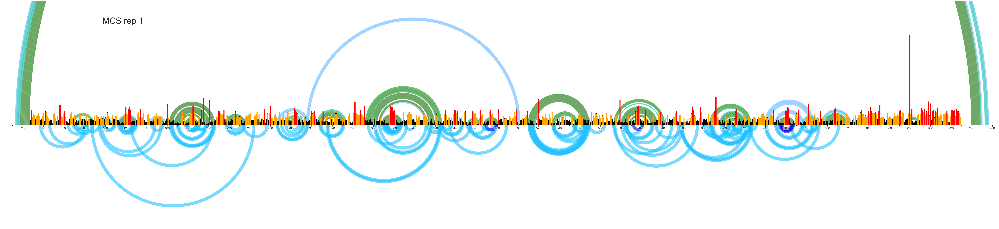

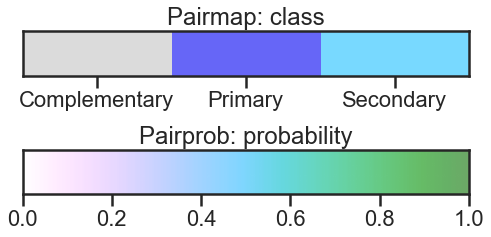

In [4]:

plot = rnav.plot_arcs(
    samples[:1],
    seq_source=MCS_seq,
    ct=None,
    interactions2="pairprob",
    interactions2_filter={
        "Probability_ge": 0.3,
    },
    interactions2_panel="top",
    profile_scale_factor=15,
    interactions="pairmap",
    seqbar=False,
)
plot.axes[0,0].set(ylim=(-100, 120))
plot.set_figure_size()

# plot.save('./images/MCS1_arcs.svg')


## Figure 3 panel B

Plot zooming in on TH inserted regions for four target mRNAs 

Note:

1. 5UTR = Target mRNA with TH in 5'-UTR
2. CDS1 = Target mRNA with TH in CDS1 position with TP experessed
3. CDS3 (or CDS2) = Target mRNA with TH in CDS2 position
4. 3UTR = Target mRNA with TH in 3'-UTR with TP expressed

Plot explaination:

- Axis includes sequence of each respective target mRNA
- Y axis includes normalized DMS reactivities (red=high, yellow=moderate, black=low)
- Above x axis includes arcs that represent pairing probabilities from RNAstructure (green=high, blue=moderate, pink=low)
- Below x axis include confidence arcs that represent PAIRs from Pairmapper (dark blue= high and light blue= moderate)
- Gaps in target mRNAs represent where THs are located in other target mRNAs.
- TH inserted regions represented in light blue, THs represented in dark blue

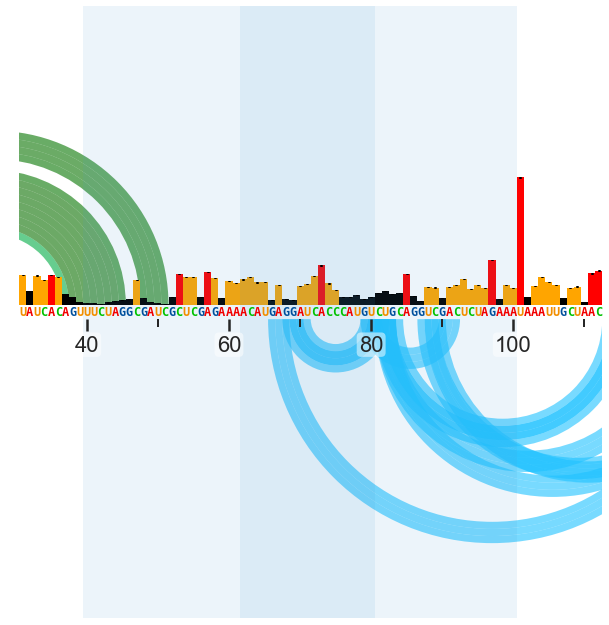

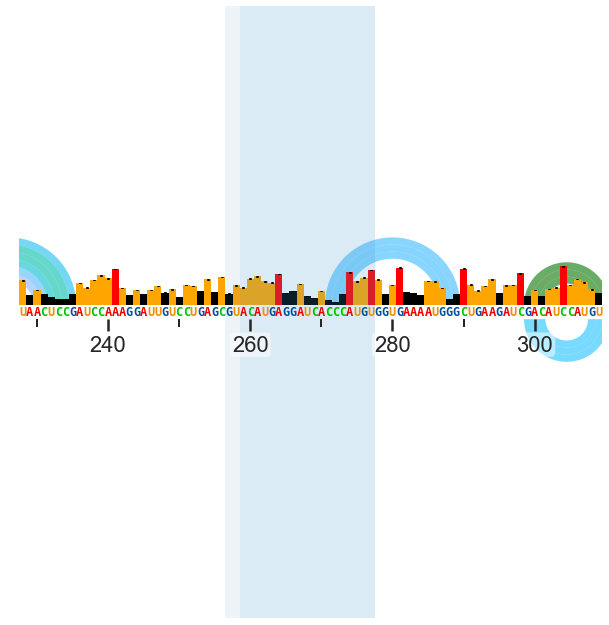

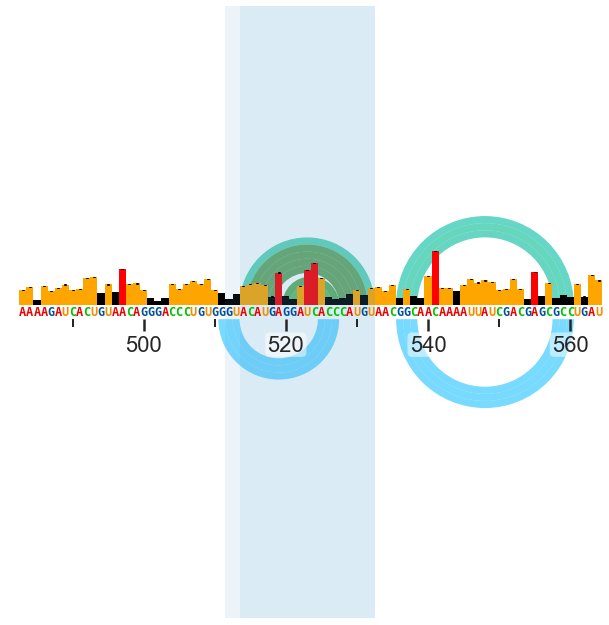

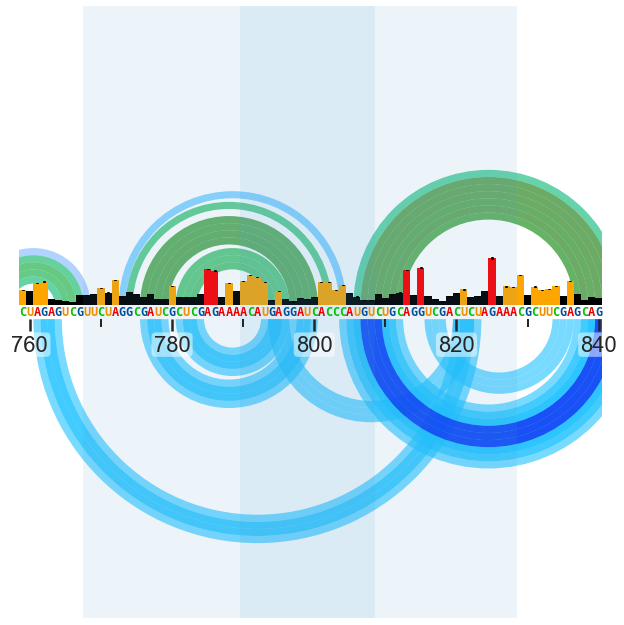

In [5]:
sl = 'ACAUGAGGAUCACCCAUGU'
sl_codon = 'GUACAUGAGGAUCACCCAUGU'
sl_spacer = 'UUCUAGGCGAUCGCUCGAGAAAACAUGAGGAUCACCCAUGUCUGCAGGUCGACUCUAGAAA'

insert_regions = [
    [UTR5, UTR5_seq, sl, '5UTR'],
    [CDS1_TP, CDS1_seq, sl, 'CDS1'],
    [CDS2, CDS2_seq, sl, 'CDS2'],
    [UTR3_TP, UTR3_seq, sl, '3UTR']
]
for comp_profile, seq, subseq, name in insert_regions:
    new_seq = seq.sequence
    idx = new_seq.find(subseq)
    start = max(0, idx-30)
    end = min(idx + 51, len(new_seq))
    region = [start, end]
    plot = rnav.plot_arcs(
        [comp_profile],
        seq_source=seq,
        profile_scale_factor=5,
        ct=None,
        interactions2="pairprob",
        interactions2_filter={
            "Probability_ge": 0.3,
            "max_distance": 600
        },
        interactions2_panel="top",
        interactions="pairmap",
        region=region,
        annotations=['sl', 'sl_codon', 'sl_spacer'],
        annotation_mode='vbar',
        title=False, colorbar=False
    )
    plot.axes[0,0].set_frame_on(True)
    plot.save(f'./images/{name}_insert_plus_minus_1_arcs.svg')


## Figure S1

Plot for all target mRNAs 

Target mRNAs labeled on top left corner 

* MCS = no-TH target mRNA
* 3UTR = Target mRNA with TH in 3'-UTR
* 5UTR = Target mRNA with TH in 5'-UTR
* CDS1 = Target mRNA with TH in CDS1 position
* CDS3 (or CDS2) = Target mRNA with TH in CDS2 position

Plot explaination

- Axis includes sequence of each respective target mRNA
- Y axis includes normalized DMS reactivities (red=high, yellow=moderate, black=low)
- Above x axis includes arcs that represent pairing probabilities from RNAstructure (green=high, blue=moderate, pink=low)
- Below x axis include confidence arcs that represent PAIRs from Pairmapper (dark blue= high and light blue= moderate)
- Gaps in target mRNAs represent where THs are located in other target mRNAs.
- TH inserted regions represented in light blue, THs represented in dark blue

In [6]:
plot = rnav.plots.AP(
    num_samples=5,
    nt_length=samples[0].data['base_seq'].length,
    rows=5)
# loop through samples and filters, adding each as a new axis
for sample, ax in zip([MCS1, UTR5, CDS1, CDS2, UTR3], plot.axes[:, 0]):
    seq = sample.data['base_seq']
    sample.filter_interactions(interactions='pairmap', fit_to=seq)
    sample.filter_interactions(interactions='pairprob', fit_to=seq)
    sample.data['dmsmap'].fit_to(seq)
    plot.add_sample(
        sample=sample,
        seq=seq,
        ct=None,
        comp=None,
        interactions='pairprob',
        interactions_panel='top',
        interactions2='pairmap',
        profile='profile',
        label=sample.sample,
        annotations=base_annotations,
        annotation_mode='vbar',
        seqbar=False,
        plot_error=False,
        profile_scale_factor=20)
    fix_ticks(ax, sample.data['fasta'])
    ax.set(ylim=[-100, 125])
plot.set_figure_size()
plot.save('./images/all_arcs.svg')


## Figure S2
### Structure similarity between target mRNAs visualized via comparison of per-nucleotide DMS reactivities

Linear regression of DMS reactivities are shown on logarithmic axes. Target mRNAs under comparison are labeled.

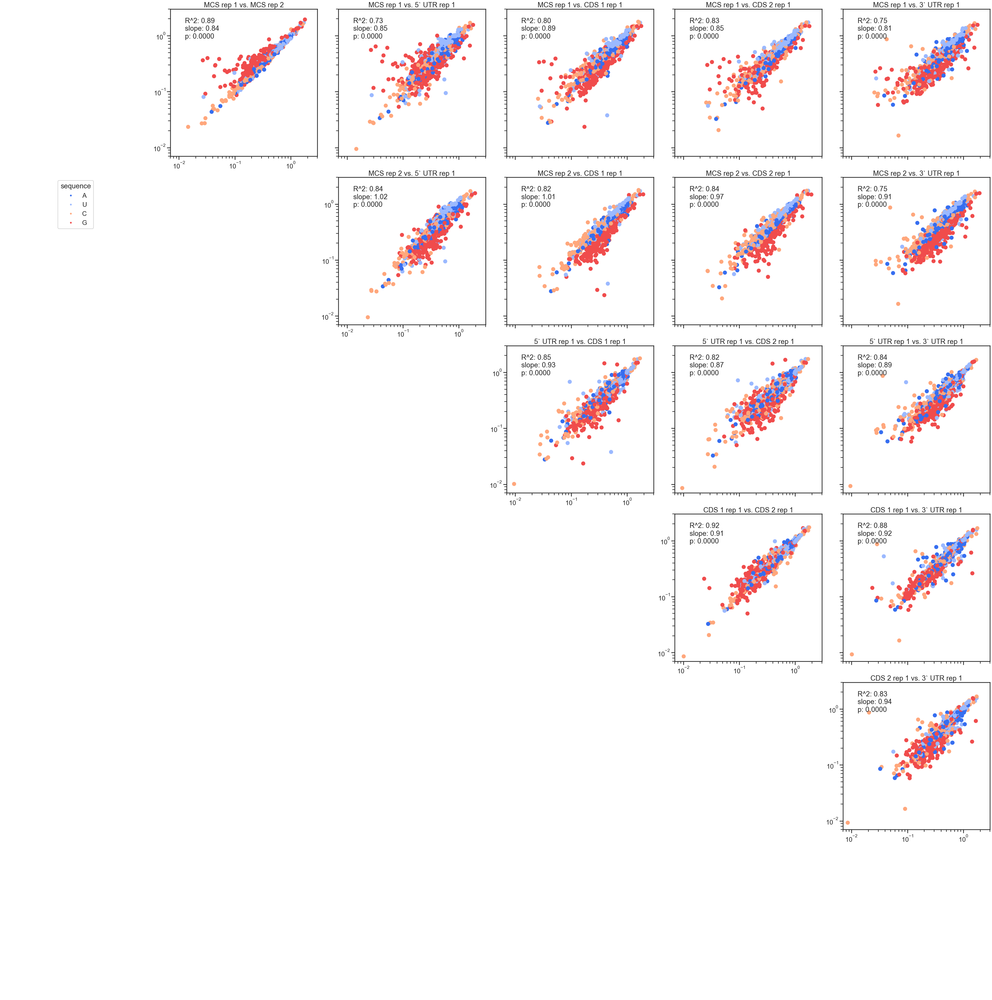

In [7]:
plot = rnav.plot_linreg(
    samples=samples,
    seq_source=base_seq,
    column="Norm_profile",
    colorby="sequence",
    ct=None,
)
for row in range(6):
    plot.axes[row, row].remove()
    for col in range(6):
        if col >= (row + 1):
            plot.axes[0, 1].set(ylim=(0.007, 3), xlim=(0.007, 3))
        if col > (row + 1):
            plot.axes[row, col].set(xticks=[0.01, 0.1, 1], xticklabels=[],
                                    yticks=[0.01, 0.1, 1], yticklabels=[])

# plot.save('./images/linear_regression.svg')